# FIRE!! - A Forest Fire Simulation with Cellular Automata
#### Author: Russell Hung, Ellie Carr, Emily Cryer and Boshen Cai
![Forest Fire](images/forest_fire.jpg)
- Fig 1. The August Complex Fire burns near Lake Pillsbury in the Mendocino National Forest, Calif., on Wednesday, Sept. 16, 2020. (AP Photo/Noah Berger) (image from https://abcnews.go.com/US/wireStory/latest-californias-sequoia-national-park-closes-fire-73082300)

# Table of Contents
These links can be used to jump to sections in the document!

<a href = '#intro'> 1. Introduction </a> <br>
<a href = '#build'> 2. Building the model </a> <br>
<a href = '#sim'> 3. Simulation of Parameters </a> <br>
<a href = '#size'> 4. Forest size </a> <br>
<a href = '#light'> 5. Lightning </a> <br>
<a href = '#growth'> 6. Tree Growth </a> <br>
<a href = '#combine'> 7. Combined Effects - Interplay of parameters </a> <br>
<a href = '#rain'> 8. Rainfall </a> <br>
<a href = '#limit'> 9. Limitations </a> <br>
<a href = '#future'> 10. Future directions </a> <br>
<a href = '#final'> 11. Final thoughts and conclusions </a> <br>

<a id='intro'> </a>

## 1. Introduction

Every year, forest fire brings massive destruction to forests worldwide. Fires can be started by humans, but can also be a natural occurrence in the forest ecosystem: for example when lightning strikes. However, forest fires have appeared to become more rampant and widespread in recent years. Extreme weather caused by climate change has caused hotter and drier weather in many places, promoting more frequent and violent blaze.

In this project we attempt to simulate a forest fire using cellular automata and perform experiments on this model: determining the effect of lightning and tree growth both separately and together, then considering the effect of adding rainfall as a new parameter into the model. We also aim to find the steady-state parameter values and the stability of it with and without rain.

<a id = "build"> </a>

## 2. Building the model

The cells on the grid can be in any one of three states on any given frame. 
- State 0 = Tree
- State 1 = Burning tree
- State 2 = Empty/Burnt 

Our model is governed by a set of rules that dictate how the state of a cell should change: <br>

 1) A burning cell turns into an empty cell in the next frame. <br>
 2) A tree will be set on fire if a neighbour is on fire. <br>
 3) A tree will be set on fire with a probability f (the probability of lightning). <br>
 4) A burn out cells can re-grow a tree with a probability p (the probability of new tree growth). <br>
 
For this examples both lightning and new tree growth probability is set to 3 %. This can be adjusted in the `config` module by setting variables `lightning` and `tree_growth`.

Certain packages were necessary to run this model. Please make sure that all that packages in the README have been installed on your workstation before attempting to run this simulation:

In [1]:
#Import packages needed to run simulations

#Numpy is used for mathmatical operations
import numpy as np 

#MatPlot is used to create graphs and run the animations
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation 

#Pandas is used for tabulating the data
import pandas as pd

#Allows for the simulation to be viewed
from IPython.display import HTML

When presenting our code we decided to split up distinct areas into modules to keep the documents tidy and allow for effective testing. Please see README for a full description of these modules. Each module contains documentation on its functions, with each function containing documentation on its functionality.

In [2]:
#Import modules needed

#Contains the functions that allow for the animation to run
from animation import animate

#Allows for set up of the grid for the animation to run
from setup import initialise, init

#Stores the variables that will be needed to run the animation
import config

In [3]:
#Run the intialise function to create a figure for animation, an empty line graph and bar chart
fig = initialise()

#This function runs the animation by repeatly calling the animate function, last_frame variable contains the number of frames to run model
anim = FuncAnimation(fig, animate, frames=100, interval=300, init_func = init)

#Set this to HTML to be displayed
HTML(anim.to_jshtml())

This simulation represents a dynamic model used to simulate a forest fire. Throughout our study, we use the colour-coded representation of trees, fires and empty cells. Intuitively, we use green for trees, red for fires and grey for burnt/empty cells. This gives a nice visual on what the hypothetical fire may look like as it spreads.

The first image displays our forest fire animation in a 2d grid. We design our forest to start with a grid filled with live trees (state 0). Fire can only start on or spread to cells with live trees. Each live tree cell has a distinct probability of setting on fire (3% in this example). A fire will spread to all neighbouring trees in all 8 directions in the next frame, except when on the edge on the grid. We assume that outside the edge of the forest there is nothing that influences the progression of the fire, therefore a fire on the edge will only spread to its remaining available neighbours. After a fire (state 1), a cell will be burnt in the next frame (state 2), and a new tree can only grow on these empty cells. Each cell in the burnt state has a distinct probability of a new tree growing (3%). A new tree cannot catch fire on the frame that it spawns. We find this a clearer way to visualise the steps our model takes as it shows trees growing before being burnt down, instead of a fire appearing out of random when in fact a tree has grown and caught fire in one short frame.

We tested our neighbourhood function using `pytest -v` to ensure that the fire was spreading to all eight neighbours and as we expected (the details of this test can be found within the test_neighbour module):

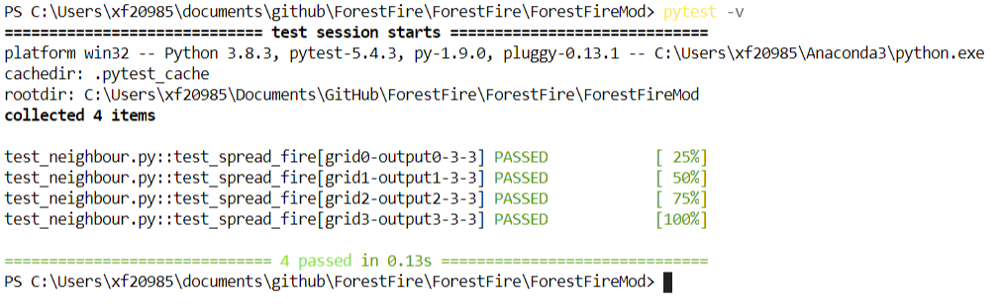

**Figure 1: Demonstrates the output of the neighbourhood test when run through Pytest with all tests passing.** <br>This test can be run by ensuring that pytest is installed on the workstation and running "pytest" in the terminal when open in the folder containing the modules for this project. This will run four tests.

We also designed the animation to record the first time when no trees remain, that they are all burnt out (state 2). In doing so, we access the speed by which a fire can completely wipe out a forest. In a real forest once a fire has destroyed a forest, the forest does often have an opportunity to grow back. This is why the animation does not stop. However in this model we record this first time the grid is "burn out" as a useful metric to compare simulations. 

The second graph is a graphical representation of the first grid. It displays the proportion of trees that are on fire or burnt out at any one frame of the animation. From this graph we note the dramatic drop initially that comes with the rapid spread of fire, even when only a few cells were on fire to begin with. We believe this is because of one cell on fire is able to spread to all eight of its neighbours, which then spread to their neighbours. At the beginning of the simulation where all the cells are live trees this causes a large drop in the number of trees. We also notice the cyclic relationship where a peak in the proportion of tree is always followed by a peak in that of fire, which in turn results in the fall in tree. This is unsurprising as the number of fires is dependent on how many trees are present (there can only be more fires if there are more trees to set on fire). This graph is important for appreciating the dynamics that affect the simulation.

This final chart represents the data from the second graph but in a dynamic bar chart form. This helps to appreciate the ratio of squares in the grid that are a tree, on fire or burnt out (empty) at any particular frame. We take note that the majority of cells are empty most of the time once the simulation has begun.

### 2.1 Cluster effect of trees

How the grid initialises could be important to the model. In our model previously we start with a grid of live trees. This is because we wanted to see how the fire would spread through a live forest. This results in a large drop in the number of live trees in the beginning. To confirm that the rapid spread of fire initially is due to clustering of trees (the "neighbour effect" as all eight neighbours are set on fire), this simulation begins with cells that have been "burnt out" (state 2). That is, the trees must first grow to be set on fire. <br>
The `reset` function resets the variables to default after the previous animation is run. 

In [4]:
from setup import reset

In [5]:
#Reset variables in config.py
reset()

#Run the intialise_empty_grid function to create a figure for animation, an empty line graph and bar chart
# istate = 2, starts the animation with empty cells
empty_fig = initialise(istate = 2)

#This function runs the animation by repeatly calling the animate function
empty_anim = FuncAnimation(empty_fig, animate, frames=100, interval=300, init_func = init)

#Set this to HTML to be displayed
HTML(empty_anim.to_jshtml())

We get a steady rise in the percentage of trees in the beginning. However, it is similar to the events after the sharp drop at the start in our original setup. It doesn't seem to have an effect on the steady-state, given enough frame numbers, as the line graph seems to follow patterns similar to those seen in section 2. That being said, we would have missed the huge effect of neighbour effect of fire spread if we had started with this setup. In conclusion, we do not think we should adjust our model to include this at the beginning. However if we were to be studying a particular area of forest that had been burnt previously (which would lead to the all the cells starting at state 2 and needing to grow), this could be a very useful addition.

<a id = "sim"> </a>

## 3. Simulations of Parameters
Now we explore the effect each individual parameter has on the spread of forest fire. We will isolate and change one parameter at a time, while keeping the others constant. First we import functions from the `simulation.py` module, which contains all the functions we need to run simulations. 

In [6]:
from sims import simulation, sim_plot, simulation_combine

The `simulation` function module allows us to call our forest fire model iteratively over a range of values for the specified parameters. The number of simulations to run per value can also be specified.

`simulation(parameter, sim_values, times)`

The function will return as lists:
- **1. The proportion of trees in the last frame**
    > Each simulation will run a maximum of 100 frames to give sufficient time for the probabilities to exert their effects. From the line graph, we find that a steady-state (without huge fluctuations in the number of trees and fires) can generally be reached. Therefore, we use the proportion of trees in the last frames as a measure of tree population.
    
    > In general, more severe fire will result in a burnout before the animation could reach the default frame number (i = 100). Since the animation automatically stops upon a burnout (more on this in the next metric), the proportion of trees will be 0 in these scenarios. 
    
    > Since one of the parameters under examination is grid size, we use proportion of trees instead of the absolute number of trees to give a fair comparison.
    
- **2. The number of frames in the simulation**
    > In our design, we record when the frame number when the first burnout event is reached. We use this as a proxy for studying more serious fires that tend to wipe out the forests. As a rule of thumb, a lower frame number indicates less time to burn out forest, and therefore a more violent blaze. Therefore, this graph tells us how likely it is for a fire to destroy all trees in the given parameter settings.

These can be plotted with the `sim_plot` function.
The `simulation_combine` can be used in a similar fashion to `simulation` but allow testing of two parameters at the same time (see section 7)

**********************************************************

In the following section, we will explore the effect of changing four variables in our model, that corresponds to the four factors we wish to investigate in the Introduction.
1. _Forest size_
2. _Rate of spontaneous fire_
3. _Rate of tree growth_
4. _Rainfall_

Due to the nature of the code we have run and the use of the `random` package in this code there is a degree of variability in results generated each time, this decreases our reproducibility. In this notebook we have recorded the results during our analysis as images and attach them together with the code used to generate them. In general, when the analysis was repeated, no major differences were found given reasonable:
- Grid size
- Number of times the simulation was run

In order to allow our work to be as reproducible as possible, we explored both these factors in section 4.

<a id = "size"> </a>

## 4. Forest size
***
### 4.1 Hypothesis and Simulation

In our simulation the forest is represented by a grid. Therefore, we thought it essential to determine an appropriate grid size and use this consistently across our simulations. Here we increase the grid size from 5x5 to 15x15 by steps of 1x1. We hypothesise that in general, a larger grid size will have a lower chance of burning out. This could be as the proportion of cells affected by fire spread is reduced. 8 neighbours in a 20 by 20 grid is only 2%, whereas in a 5 by 5 grid it is a whopping 32%! In addition, a longer time to burn out also means a higher chance for trees to regrow in empty cells, further reducing the chance of a burnout.

We keep the probability of both lightning and tree_growth as 3% throughout this experiment.
This cell can be run as an example of the experiment.

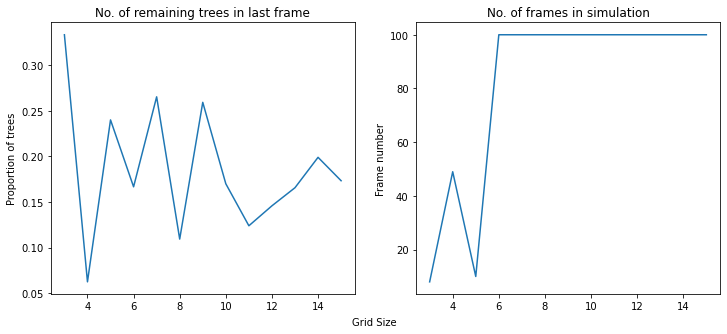

In [7]:
#reset the variables
reset()

# Create simulation values from 3 to 15
size_sim_values = np.arange(start = 3, stop = 16)

# Run simulation for forest size, parameter = 2 specifies we change the values of GRID_WIDTH & GRID_HEIGHT
size_rem_trees, size_last_frame = simulation(parameter = 2, sim_values = size_sim_values, times = 1)

# Plot the results
sim_plot(size_sim_values, size_rem_trees, size_last_frame, 'Grid Size')

It seems that there is a high level of variability in the results, especially in the lower end of the grid size. When run for a few times, the simulation gives us drastically different results. We therefore explore the variation from 10 separate runs of the simulation with grid size 3x3 - 9x9 to observe the variations.

### 4.2 Variation in simulations

In this section we explore the effect of grid size on the variability of our simulation results. This is notable when working with random values, as we aim to increase our reproducibility as much as possible. We notice that a smaller grid size tends to have a higher variability. We postulate that this is also due to the cluster effect mentioned in section 2.1. Imagine in a 3x3 forest, if a fire were to spread to all its neighbours, then around most of trees are wiped out in one frame (100% if fire is in the middle). Even if trees were to grow next frame, the proximity of new tree to fire means that it will be burnt as soon as it emerges. This leaves little room for the probabilities to exert their effects. 

In [ ]:
# Import pandas module for construction of data frame
import pandas as pd

# Values for investigating variability
low_values = [3, 4, 5, 6, 7, 8, 9]

# Empty list to store no. of remaining trees ...
rem_tree = []
# ... and the last frame number
last_frame = []

# Loop to run simulation 10 times for each value in low_values list
for value in low_values:
    # Temporary list to hold results
    temp1 = []
    temp2 = []
    
    # Loop to run simulation 10 times
    for i in range(10):
        
        # Convert simulation value to array dtype
        size = np.array([value])
        
        # Run the simulation, parameter for size
        rem, last = simulation(parameter = 2, sim_values = size, times = 1)
        
        # Append results to temp list
        temp1.append(rem[0])
        temp2.append(last[0])
        
    #Append temp lists to result lists    
    rem_tree.append(temp1)
    last_frame.append(temp2)

We then put the results into data frames, compute the standard deviation for each values to observe the variation.

In [ ]:
# Convert rem_tree into data frame, columns = the nth simulation, rows = grid size values
rem_tree_df = pd.DataFrame(np.array(rem_tree), index= low_values)

# Compute SD across the rows
rem_tree_df['SD'] = rem_tree_df.std(axis = 1)

# Show data frame
rem_tree_df

![remaining_trees](images/rem_tree.png)
- **Table 1. Table of the proportion of remaining trees across a variety of grid sizes from 3x3 to 9x9** - The table above describes the proportion of trees left in the last frame of simulation for different values of grid size. Each value was repeated 10 times (shown by the columns 0 to 9). The row shows the grid size values and the columns show the proportion of the trees left in the last of frame of each repetition of a value.

The variation in the remaining proportion of trees across each of the grid sizes is relatively small. In the grids smaller than 5x5, the simulations generally failed quickly therefore 0 trees are left. This explains their very low standard deviations across the grid sizes. This standard deviation peaks at the 5x5 grid size. As the grid size increases past 5x5, variation in the remaining number of trees for each grid size decreases and the number become more or less stable throughout the analysis.  Therefore it appear for averages of the proportion of remaining trees the larger grids are less variable.

This next analysis then continues by studying the effect of varying grid size on reproducibility related to the last frame number:

In [ ]:
# Convert last_frame into data frame, columns = the nth simulation, rows = grid size values
last_frame_df = pd.DataFrame(np.array(last_frame), index = low_values)

# Compute SD across the rows
last_frame_df['SD'] = last_frame_df.std(axis = 1)

# Show data frame
last_frame_df

![last_frame](images/last_frame.png)
- **Table 2. Table to show the last frame number of simulations using grids with sizes ranging from 3x3 to 9x9** - The table above describes the proportion of trees left in the last frame of simulation for different values of grid size. Each value was repeated 10 times (shown by the columns). The row shows the grid size values and the columns show the proportion of the trees left in the last of frame of each repetition of a value.

The variation for the number of frames is much greater than the proportion of trees left. The maximum SD is observed at grid size 5x5, which means it is at 5x5 where there is a moderate chance for the simulation to either burn out quickly or reach the 100th frame. This is notable as is also the most variable for the proportion of remaining trees. The 6x6, 8x8 and 9x9 grids all have very low standard deviations as all the simulations burn out.

A high standard deviation makes predictions unreliable, especially when the distribution of values are skewed towards one end. In our 5x5 grid simulations *(Table 2)*, 3 out of 10 simulations only reached 5 frames while 5 were able to reach the 100th frame. This is obviously an inaccurate representation of events and is not very reproducible. When examining the animation, we notice that for lower grid size, there is a bottleneck initially where the spread of fire has a high chance to wipe out the entire forest before new trees can grow. However, once this bottleneck is passed, the animation generally has a good chance to proceed to the end. As we increase the grid size, this effect seems to have diminished. As seen in the results, at size 8x8 or above, the results generally converged well when looking at both the last frame number and proportion of remaining trees. 
In this experiment we ran the simulations 10 times. However, this could be inadequate. When looking at the results of grid size 7 x 7, one of the iteration burnt out at frame 5. We wanted to ensure that we were running the simulations enough times to capture accurate results but also reduce the effect of any extreme values on our mean. Therefore, we also explore the effect of running the simulation multiple times to raise our confidence in the conclusions we draw.

### 4.3 Repetition Matters - Appropriate Number of Times to Run Simulation

Here we determine the number of repetitions to run simulations for each value of a parameter. Since we use ```numpy.random``` method in our model there will be a certain degree of variability in each iteration, as seen above.
To minimise the impact of randomness, we compare the results obtained from running the simulation over a range of 10 values for 10, 20 and 30 times. We also take note of the computational demand and aim to maintain balance between accuracy and time. 

We noticed above that for grid size that are too small (smaller than 5x5) the simulations burn out too quickly. There is not enough space for the parameters to run their course. Therefore, we explore with grid size values starting from 5x5:

In [ ]:
#Create simulation values from 5 to 16 for grid size
size_sim_values = np.arange(start = 5, stop = 16)

Here we attach the results of our simulation, along with the code used to produce them.

#### 10 times

In [ ]:
size_rem_trees, size_last_frame = simulation(parameter = 2, sim_values = size_sim_values, times = 10)

sim_plot(size_sim_values, size_rem_trees, size_last_frame, 'Grid Size')


![10](images/size_10times.png) 
- **Fig 2. The effect of grid size on the outcome of the simulation with each parameter run 10 times** - The graph shows the no. of remaining trees in last frame and the no. of frames in simulation for when each value was run for 10 times and an average taken.

#### 20 times

In [ ]:
size_rem_trees, size_last_frame = simulation(parameter = 2, sim_values = size_sim_values, times = 20)

sim_plot(size_sim_values, size_rem_trees, size_last_frame, 'Grid Size')

![20](images/size_20times.png) 
- **Fig 3. The effect of grid size on the outcome of the simulation with each parameter run 20 times** - The graph shows the no. of remaining trees in last frame and the no. of frames in simulation for when each value was run for 20 times and an average taken.

#### 30 times

In [ ]:
size_rem_trees, size_last_frame = simulation(parameter = 2, sim_values = size_sim_values, times = 30)

sim_plot(size_sim_values, size_rem_trees, size_last_frame, 'Grid Size')

![30](images/size_30times.png) 
- **Fig 4. The effect of grid size on the outcome of the simulation with each parameter run 30 times** - The graph shows the no. of remaining trees in last frame and the no. of frames in simulation for when each value was run for 30 times and an average taken.

#### Comparing number of times

For each parameter value we found the mean of the proportion of remaining trees and the last frame where the simulation reached 100 frames or "burnt out". The results from running the simulation 10 times have considerable fluctuations, especially in the number of remaining trees. As we increase the number of times to 20 or 30, we see that these variations significantly decrease.

We also observe differences in the second plot (no. of frames). When compared to the results of 10 times and 20 times, simulations ran for 30 times showed more values at the lower end of the spectrum not being able to reach the 100th frame. We find this difference to be important and suspect that crucial information may be missed when simulations are only run for less than 20 times.

We explore a smaller set of values that are smaller (that is, the simulation is more likely to "burn out") and run the simulation for 25 times (as is between 20 and 30) to see if similar results are observed.

#### 25 times

In [ ]:
size_rem_trees, size_last_frame = simulation(parameter = 2, sim_values = size_sim_values, times = 25)

sim_plot(size_sim_values, size_rem_trees, size_last_frame, 'Grid Size')

![25](images/size_25times.png) 
- **Fig 5. The effect of grid size on the outcome of the simulation with each parameter run 25 times** - The graph shows the no. of remaining trees in last frame and the no. of frames in simulation for when each value was run for 25 times and an average taken.

We see that running the simulation for 25 times sufficiently captures the differences among values, especially in the second plot. This gives us a relatively high degree of confidence for using 25 times for the rest of our simulations.

### 4.4 Stability of Steady State

Irrespective of the number of times the simulation was run, we see that for grid size lower than 6x6 the model performs quite poorly at predicting steady state. The forest burns out prematurely before we can study the interactions of the variables. The smallest grid size to reach the 100th frame is 8x8 and 9x9 in 25 times and 30 times respectively. In both number of times, the average proportion of remaining trees also hovers around 18% in the last frame for grid size greater than 8x8. 

To conduct fair investigation and minimise the effect of grid size, we have settled on a grid size of 10x10 for subsequent simulations of other parameters in finding the steady state. We find that in general, a larger grid size gives more stable results and are more representative of the long term effect of parameters that we aim to investigate. However, larger grid size also inevitably means more computational resources and time. To balance model accuracy and time, we feel sufficiently confident in a grid size of 10 to obtain reproducible results while maintaining decent runtime.

<a id = "light"> </a>

## 5. Lightning
***

### 5.1 Introduction

After considering the size of the grid and number of times the simulation should be run for we wanted to study the effects of lightning and tree growth. Ultimately, we aimed to consider both these probabilities together to determine their effect with each other. This is because in a true life forest tree growth and lightning will occur at the same time. However, before considering both the parameters together we want to test the effects of lightning and tree growth separately: keeping one the same while testing the other. Both of these factors operate in a similar fashion by having a probability assigned. However, we hypothesised that both could have large, and possibly different, effects on the outcome of the simulation. A set of lightning probabilities is provided for the simulation, while new tree growth is kept to 3 %. Due to the large drop in number of trees at the beginning of the simulation observed in section 2, we were interested whether a large probability of fire was even necessary with a low probability of tree growth such as 0.03 as this seemed to spread fire quickly. This first simulation tests the probability from 0.1 to 1.0 in 0.1 steps and runs each value 25 times on a 10x10 grid, following the results of our previous investigations. Of these 25 simulations the mean number of trees in the last frame and mean last frame number was found for each value (as in the grid size experiments) and plotted. The mean was chosen as gave the smoothest line when plotted.

We hypothesised:

A) As lightning probability increases, the average number of remaining trees in the simulation will decrease.

B) As lightning probability increases, the average frame where "burn out" is achieved will decrease.

C) Lightning will have a large effect on the simulation, it will not take a very high probability of fire to cause burn out due to the smaller size of the grid.

### 5.2 The simulation

This utilises the simulation function as in 4.1. However, instead the parameter is set to test lightning and an array of values for lightning is provided to test each 25 times.

In [ ]:
#Sets the lightning simulation values in a numpy array.
lightning_sim_values = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])


#Runs the simulation function. 1 represents the lightning simulation, sets the values to be tested and runs this 25 times.
lightning_rem_trees, lightning_last_frame = simulation(parameter = 1, sim_values = lightning_sim_values, times = 25)

# Plot the results
sim_plot(lightning_sim_values, lightning_rem_trees, lightning_last_frame, "Probability of Lightning")

To effectively compare the values, one must compare the final outputs. A method for this is plotting parameter values against number of remaining trees in the last frame (how many squares ended in state 0 when the simulation "burnt out" or reached 100 frames) and against the number of frames the simulation ran for (100 being the maximum). This allows for a good comparison on how the parameter changes the simulation and final outcome.

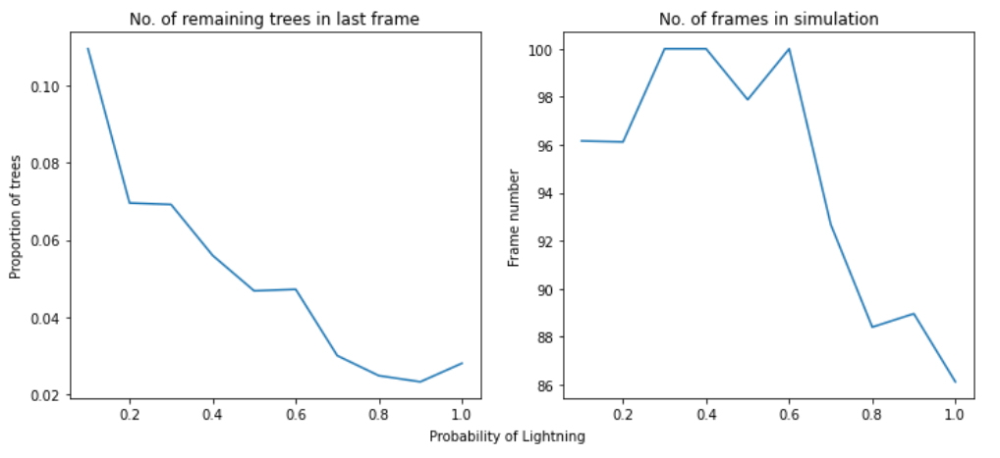

**Figure 6: As the probability of lightning increases, the number of remaining trees and the number of frames in a simulation decreases.** <br>
This shows the effect of differing probability of lightning on the outcome of a simulation. The probability of lightning increases in steps of 0.1 from 0.1 to 1.0 and each value is run 25 times. The first graph shows this effect on the number of remaining trees in the last frame and the second the number of frames achieved in the simulation before "burn out".

This graph demonstrates how differing probabilities of lightning impacts a simulation. This graph shows values 0.1 - 1.0 (inclusive) on a 10x10 grid and 0.03 new tree growth probability. As expected, as the probability of lightning increases, the average proportion of remaining trees in the last frame decreases. In addition, generally as probability of lightning increases, the average last frame number decreases. This supports both hypotheses A and B. Even with high values for lightning all of the simulations ran on average to above 80 frames. This is unexpected as we were previously concerned that the simulations would "burn out" very quickly when looking at any higher lightning probabilities. It appears that even if the probability is low, there is still tree growth preventing total burn out and this has a profound effect. This calls into question our final hypothesis, maybe lightning probability does not have as large of an effect.

We were interested in testing some of these parameters at a higher resolution in order to capture any more effects. Parameters between 0.3 and 0.9 have therefore been selected to be tested with smaller "steps":

In [ ]:
#Sets the lightning simulation values in a numpy array.
lightning_sim_values = np.array([0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9])

#Runs the simulation function. 1 represents the lightning simulation, sets the values to be tested and runs this 25 times.
lightning_rem_trees, lightning_last_frame = simulation(parameter = 1, sim_values = lightning_sim_values, times = 25)

#Plot the results
sim_plot(lightning_sim_values, lightning_rem_trees, lightning_last_frame, "Probability of Lightning")

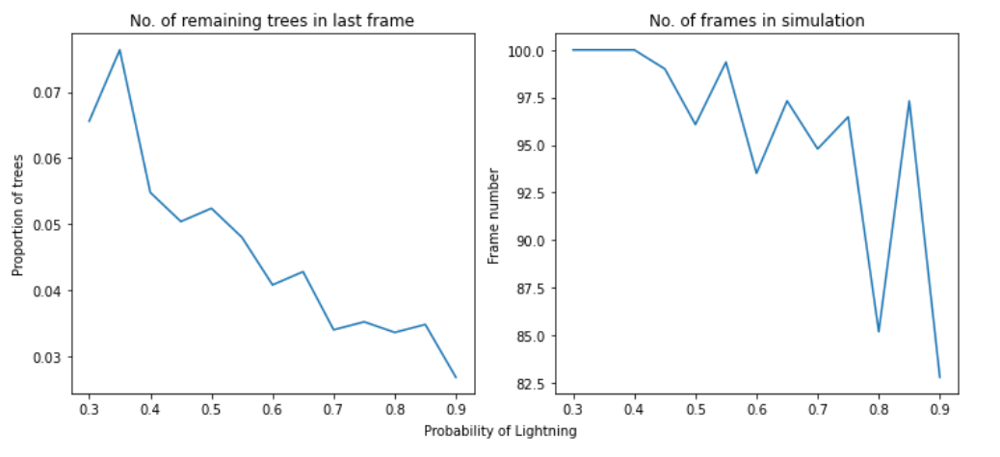

**Figure 7: As the probability of lightning increases, the number of remaining trees and the number of frames in a simulation decreases.** <br> This shows how the effect of differing probability of lightning. This works in steps of 0.05 from 0.3 to 0.9 and each value is run 25 times. The first graph shows this effect on the number of remaining trees in the last frame and the second the number of frames achieved in the simulation before "burn out".

Again, the mean of all the simulations is still above 90 frames but some simulations do appear to burn out from a 40% of chance of lightning. However, even 90% chance of lightning has on average above 80 frames in the simulation which is unexpected. Again, the graph shows that as the probability of lightning increases, the average number of trees in the final frame of the simulation decreases and the average ending frame number decreases. The lines show a lot of more variability due to the small scale on the y axis on both these graphs.

These experiments give evidence for hypotheses A and B as probability of lightning does have a negative effect on the number of trees in the last frame and the frame number the simulation ends on. However hypothesis C is questioned as even at high probabilities of lightning the simulation "burnt out" on an average of above 90 frames. Therefore it is likely that lightning is not having as large of an effect as we previously thought. At the beginning of the simulation when the fire is first spreading the "neighbourhood effect" has a profound effect- spreading to all 8 neighbours. Yet, this does not explain why at high values for lightning probabilities the average number of frames is still over 80, this is quite far into a simulation. This is likely due to some tree growth occurring, even if this is only at 3% probability of occurring. Therefore it makes logical sense to test the effect of varying probability of new tree growth on the simulation.

<a id = "growth"> </a>

## 6. Tree Growth
***

### 6.1 Introduction

After finding that even very low probabilities of new growth were preventing the simulations burning out when testing the effect of lighting, we were interested to study what effect new tree growth could have. This was gone about in a similar fashion to the lightning values, using 0.1 steps from 0.1 to 1.0 for new tree growth probability and running the simulation 25 times. The same dependent variables were used: average number of trees in the last frame and average number of the last frame in the simulation.

We hypothesised:

A) As probability of new tree growth increases, the average number of remaining trees in the final frame will increase.

B) As probability of new tree growth increases, the average number of frames in a simulation before "burn out" will increase.

### 6.2 The Simulation

In [ ]:
#Create simulation values
tree_sim_values = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

#Runs the simulation function. 0 represents the tree growth simulation, sets the values to be tested and runs this 25 times.
tree_rem_trees, tree_last_frame = simulation(parameter = 0, sim_values = tree_sim_values, times = 25)

#Plot the results
sim_plot(tree_sim_values, tree_rem_trees, tree_last_frame, "Probability of New Tree Growth")

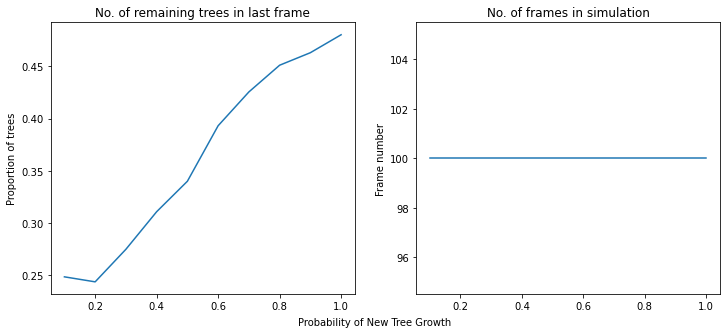

**Figure 8: As the probability of new tree growth increases, the average number of remaining trees in a simulation increases.** <br> This shows how the effect of differing probability of new tree growth on the outcome of the simulation. This works in steps of 0.1 from 0.1 to 1.0 and each value is run 25 times. The first graph shows this effect on the number of remaining trees in the last frame and the second the number of frames achieved in the simulation before "burn out".

This graph demonstrates how differing probabilities of new tree growth affect a simulation. This graph shows values 0.1 - 1.0 (inclusive) on a 10x10 grid and 0.03 lightning probability. Number of remaining trees in the last frame range from 25% to 50% of trees remaining which are fairly large proportions, again this suggests that tree growth has a profound effect on the simulation. As expected, as the probability of new tree growth increases the proportion of trees left increases. This gives evidence toward our first hypothesis. However, all the simulations run until the end of the simulation (100 frames). It is therefore hard to argue for or against our second hypothesis as there is no change in number of frames in the simulation. It could be that new tree growth has such a profound effect that even 0.1 probability is enough to keep a simulation running, or that 100 frames is not enough to show the effect of new tree growth probability on simulation length. Therefore in future work it would be advantageous to repeat this experiment but running for more frames to attempt to capture any possible effect.

There is little change between 0.1 and 0.2 therefore 0.1 will be excluded from the next simulation values. 0.8 and above will also be excluded as this will likely result in too much tree growth and prevent an accurate simulation. Therefore values 0.2 to 0.8 will be investigated further:

In [ ]:
#Create simulation values
tree_sim_values = np.array([0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8])

#Runs the simulation function. 0 represents the tree growth simulation, sets the values to be tested and runs this 25 times.
tree_rem_trees, tree_last_frame = simulation(parameter = 0, sim_values = tree_sim_values, times = 25)

#Plot the results
sim_plot(tree_sim_values, tree_rem_trees, tree_last_frame, "Probability of New Tree Growth")

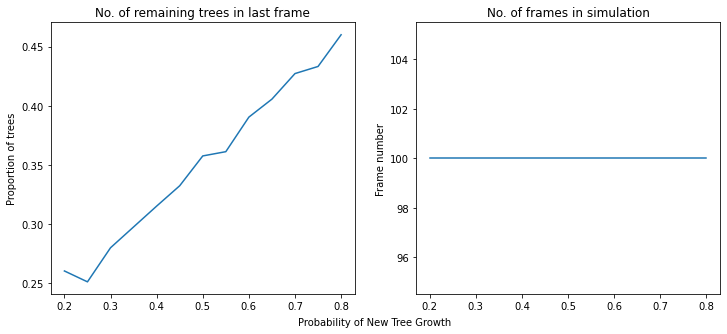

**Figure 9: As the probability of new tree growth increases, the average number of remaining trees in a simulation increases.** <br> This shows how the effect of differing probability of new tree growth on the outcome of the simulation. This works in steps of 0.05 from 0.2 to 0.8 and each value is run 25 times. The first graph shows this effect on the number of remaining trees in the last frame and the second the number of frames achieved in the simulation before "burn out".

This plot uses 0.05 steps between 0.2 and 0.8 probability of new tree growth, the simulations are run 25 times. Again, this graph shows that as the probability of new tree growth increases the average number of trees in the last frame also increases. All the simulations on average are running until the end (100 frames) which was to be expected following the results of the previous experiment. We have evidence for the first hypothesis as the probability of new tree growth has a positive effect on the number of remaining trees. However as all the simulations ran to 100 frames we cannot comment on the second hypothesis. These experiments demonstrate that new tree growth has a profound effect on the model. Even at low new tree growth probabilities such as 0.1, the simulations were running to completion. This could be because to fufil our definition of the simulation ending all the cells must be "burnt out". Therefore, if this was about to occur and there was a 10% chance of new tree growth: then we would expect around 10 out of the 100 cells to regrow. We predict that the rapid nature of the new trees growing, allows the simulation to continue whenever it becomes close to "burning out".

<a id = "combine"> </a>

## 7. Combined Effects - Interplay of Parameters
***

### 7.1 Introduction

In a real forest fire both lightning and tree growth occur at the same time. Therefore we deemed it important to consider them together. We are interested in looking for a set of "steady state" parameters, these will allow the simulation to extend for a long time, in this case 10 000 frames. When testing new tree probability all the simulations ran to 100 frames, but when considering lightning probability this was not true. Therefore we were interested what the effect would be when manipulating the two parameters together.

Previously, experiments ran for 100 frames. However after noticing all the simulations ran to the end when considering the new tree growth parameters we decided to increase this number to 10 000 frames to try and allow more simulations to "burn out". Therefore we will be defining reaching a "steady state" as reaching 10 000 frames as this means the simulation is unlikely to "burn out". This approach is not perfect as the simulation could still burn out past 10 000 frames. However, due to time and computing power restrictions this was deemed a suitable measurement.

As "steady state" would likely be a range of values, we were interested in what the minimum new tree growth values the lightning variables would need to reach this steady state. This will give more insight in how the parameters are affecting the simulation. For each experiment each lightning parameter will be tested against each tree growth parameter. The same dependent variables will be used: the mean number of remaining trees and the mean last frame number.

We hypothesised:

As the probability of lightning increases, the probability of new tree growth must also increase to achieve a steady state and prevent the grid "burning out" and ending.

### 7.2 The interplay of parameters

#### 7.2.1 The first simulation

The simulation now uses the `simulation_combine` function from the `sims` module. This takes an array for lightning values and array for new tree growth probability values. This returns the remaining trees and the last frame as before, however also returns the condition that was tested. This allows for tabulating the data. As there are two independent variables, instead of plotting graphs as before this information will be represented in pandas table. This will allow for easy filtering and data manipulation for further analysis. As these tables are large, the results can be represented graphically in three dimensions (lightning probability, new tree growth and "burn out" frame) for ease of looking for trends and comparing conditions.

As we were unclear which values should be tested we selected a range of lightning and new tree growth probabilities values in order to determine a range to be tested in. With lightning probability this is a set of variables that ranges from 0 to 1. As new tree growth seemed to have such a large effect we only used the values 0.5 and under to find the minimum new tree growth probability to achieve 10 000. The number of times each simulation was run was also reduced to 10 to reflect the large number of simulations we would be running. This number is still high enough that we believe it will reduce the chance of extreme values impacting our result. We decided to include controls for this experiment: using 0 for lightning (checking simulations could reach 1000 frames) and 0 for new tree growth (checking that simulations could burn out).

In [ ]:
from sims import simulation_combine

#Sets the lightning simulation values in a numpy array.
lightning_sim_values = np.array([0.0, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0])
tree_sim_values = np.array([0.0, 0.1, 0.2, 0.3, 0.4, 0.5])


#Runs the simulation function. This takes the lightning and tree values are applies them in sequence. This is run 10 times over 10 000 frames.
steady_rem_trees, steady_last_frame, steady_conditions = simulation_combine(light_values = lightning_sim_values, tree_values = tree_sim_values, times = 10, frame_num = 10000)

In [ ]:
#Tabulating the data
#Set the column labels
column_labels = ["Lightning_Probability", "New_Tree_Probability", "Number_of_trees_left", "Last_frame"]

#Create a array to store the data
steady = []

#Add the condition, number of trees left in the final frame and the number of the last frame number into the array
for i in range(len(steady_conditions)):
    steady.append([(steady_conditions[i][0]), (steady_conditions[i][1]), (steady_rem_trees[i]), (steady_last_frame[i])],)

#Turn this array into a pandas dataframe, setting the columns to be the names in the column names array
df_steady = pd.DataFrame(data = steady, columns = column_labels)
df_steady

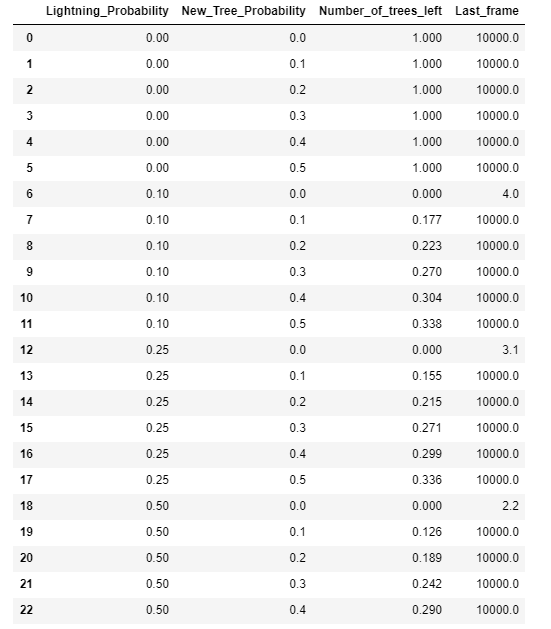

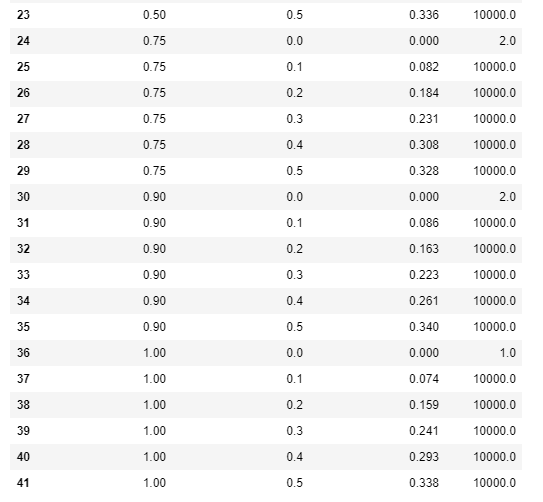

**Table 3: The effect of varying new tree and lightning probability on the outcomes of a simulation.** <br>
This table displays the average number of trees left and the average number of the last frame. This uses lightning values from 0.0 to 1.0 with new tree probabilities from 0.1 to 0.5. There are two controls of 0 for lightning probability and 0 for new tree growth probability. Each simulation is run 10 times.

In [ ]:
#Import the packages needed for graphing
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

#Set up the figure and plot
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

#Create a new line for each lightning probability for ease of reading
data_1 = df_steady[df_steady.Lightning_Probability == 0.1]
data_2 = df_steady[df_steady.Lightning_Probability == 0.25]
data_3 = df_steady[df_steady.Lightning_Probability == 0.5]
data_4 = df_steady[df_steady.Lightning_Probability == 0.75]
data_5 = df_steady[df_steady.Lightning_Probability == 0.9]

#Add labels for the x, y  and z axis
ax.set_xlabel('Lightning Probability')
ax.set_ylabel('Tree Probability')
ax.set_zlabel('Last frame number in simulation')

#Plot each line individually
ax.plot(xs = data_1.Lightning_Probability, ys = data_1.New_Tree_Probability, zs = data_1.Last_frame)
ax.plot(xs = data_2.Lightning_Probability, ys = data_2.New_Tree_Probability, zs = data_2.Last_frame)
ax.plot(xs = data_3.Lightning_Probability, ys = data_3.New_Tree_Probability, zs = data_3.Last_frame)
ax.plot(xs = data_4.Lightning_Probability, ys = data_4.New_Tree_Probability, zs = data_4.Last_frame)
ax.plot(xs = data_5.Lightning_Probability, ys = data_5.New_Tree_Probability, zs = data_5.Last_frame)

#Add a figure legends for easy reading
ax.legend([0.1,0.25,0.5,0.75,0.9])

#Show the graph
plt.show()


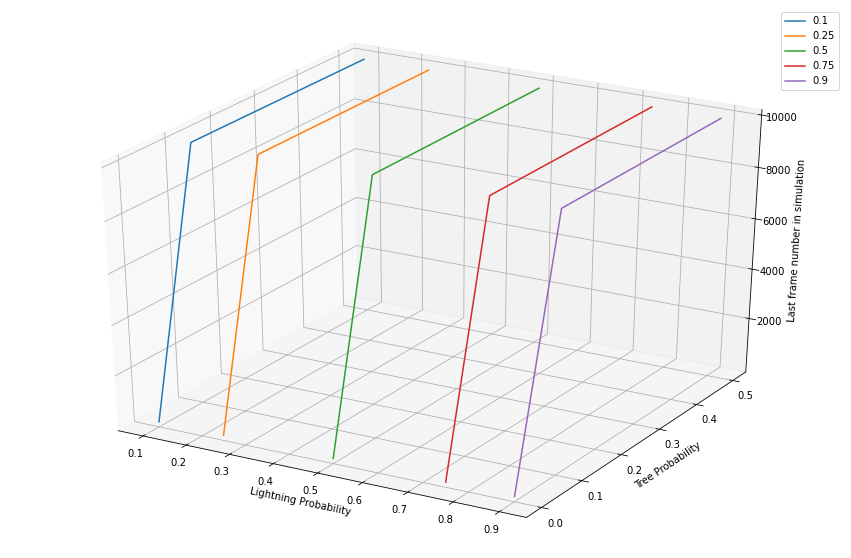

**Figure 10: A plot to show the effect of lightning and new tree growth probability on when "burn out" of the simulation occurs.** <br>
This graph shows how the lightning probability (x axis) together with probability of new tree growth (y axis) reflects how far the length of the simulation(z axis). Lightning values were tested in increments from 0.1 to 0.9. Tree probability was tested from 0 to 0.5 in 0.1 increments. Each simulation was run 10 times. The maximum frame number is 10 000.

This dataframe and graph shows the results of this experiment. We did not expect for so many of these experiments to reach 10 000 frames as we were using such high lightning probabilities and low new tree growth values. Interestingly, for all the lightning values this minimum point to achieve 10000 frames appears to sit before 0.1. This went against our hypothesis that this minimum new tree probability will be variable depending on the tree probability. However, as these simulations were ending at different frame numbers we were interested to test again at a higher resolution as this does suggest a different simulation outcome dependent on lightning value.

#### 7.2.2 The second simulation

Due to the results of the previous experiment, we tested again at a higher resolution: testing between 0.01 and 0.05. We also decided to include controls again for this experiment: using 0 for lightning (checking simulations could reach 1000 frames) and 0 for new tree growth (checking that simulations could burn out).

In [ ]:
import sims
#Sets the lightning simulation values in a numpy array. 0 values used as a control.
lightning_sim_values = np.array([0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])
tree_sim_values = np.array([0.0, 0.01, 0.02, 0.03, 0.04, 0.05])


#Runs the simulation function. This takes the lightning and tree values are applies them in sequence. This is run 10 times over 10 000 frames.
rem_trees, last_frame, conditions = simulation_combine(light_values = lightning_sim_values, tree_values = tree_sim_values, times = 1, frame_num = 100)

In [ ]:
#Tabulating the data
#Set the column labels
column_labels = ["Lightning_probability", "New_Tree_probability", "Number_of_trees_left", "Last_frame"]


#Set an empty array to store the data
data_refined = []


#Add the condition, number of trees left in the final frame and the number of the last frame number into the array
for i in range(len(conditions)):
    data_refined.append([(conditions[i][0]), (conditions[i][1]), (rem_trees[i]), (last_frame[i])],)

#Turn this array into a pandas dataframe, setting the columns to be the names in the column names array
df_steady_refined = pd.DataFrame(data = data_refined, columns = column_labels)
df_steady_refined

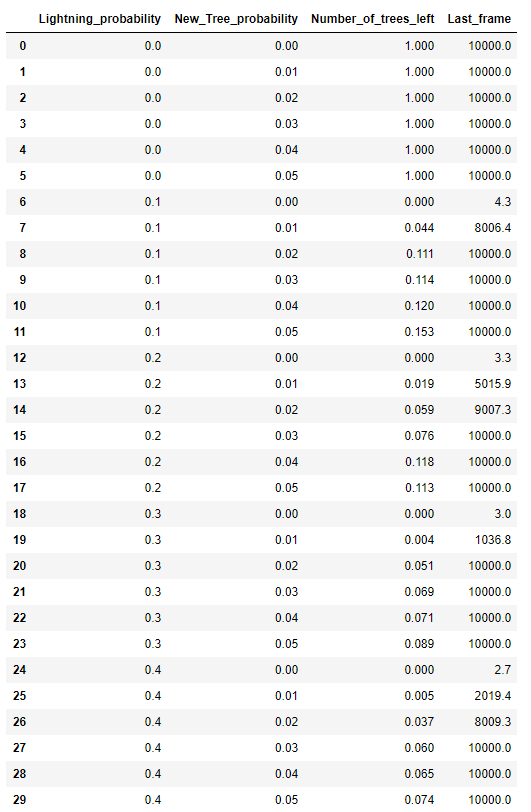

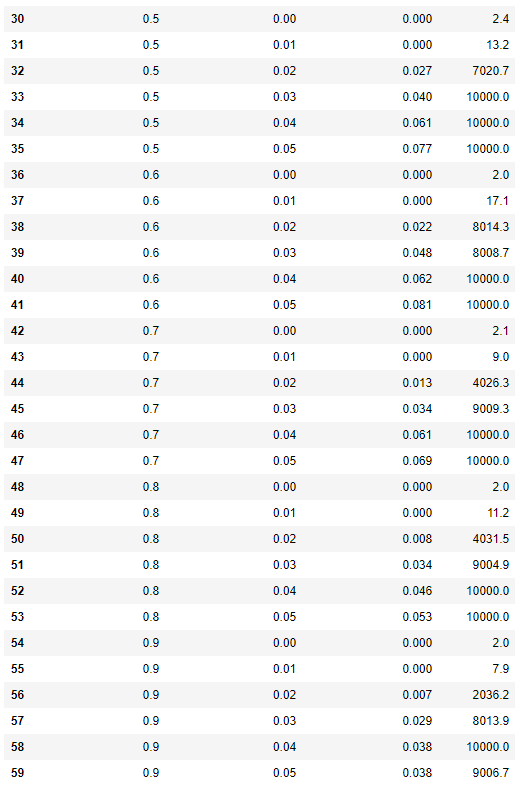

**Table 4: The relationship between probabilities for lightning and new tree growth and the outcome of the simulation.** <br>
The first two columns demonstrate the conditions for the simulation. That is: the lightning and tree growth probabilities. The third column shows the proportion of trees left in the final frame of the simulation. The final column shows frame the simulation reached with the maximum being 10 000. Each simulation was run 10 times.

In [ ]:
#Import the packages needed for graphing
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

#Set up the figure for plotting
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

#Create a new line for each lightning probability
data_1_refined = df_steady_refined[df_steady_refined.Lightning_probability == 0.1]
data_2_refined = df_steady_refined[df_steady_refined.Lightning_probability == 0.2]
data_3_refined = df_steady_refined[df_steady_refined.Lightning_probability == 0.3]
data_4_refined = df_steady_refined[df_steady_refined.Lightning_probability == 0.4]
data_5_refined = df_steady_refined[df_steady_refined.Lightning_probability == 0.5]
data_6_refined = df_steady_refined[df_steady_refined.Lightning_probability == 0.6]
data_7_refined = df_steady_refined[df_steady_refined.Lightning_probability == 0.7]
data_8_refined = df_steady_refined[df_steady_refined.Lightning_probability == 0.8]
data_9_refined = df_steady_refined[df_steady_refined.Lightning_probability == 0.9]

#Add axes labels
ax.set_xlabel('Lightning Probability')
ax.set_ylabel('Tree Probability')
ax.set_zlabel('Last frame number in simulation')

#Plot each line on the graph using a new colour
ax.plot(xs = data_1_refined.Lightning_probability, ys = data_1_refined.New_Tree_probability, zs = data_1_refined.Last_frame)
ax.plot(xs = data_2_refined.Lightning_probability, ys = data_2_refined.New_Tree_probability, zs = data_2_refined.Last_frame)
ax.plot(xs = data_3_refined.Lightning_probability, ys = data_3_refined.New_Tree_probability, zs = data_3_refined.Last_frame)
ax.plot(xs = data_4_refined.Lightning_probability, ys = data_4_refined.New_Tree_probability, zs = data_4_refined.Last_frame)
ax.plot(xs = data_5_refined.Lightning_probability, ys = data_5_refined.New_Tree_probability, zs = data_5_refined.Last_frame)
ax.plot(xs = data_6_refined.Lightning_probability, ys = data_6_refined.New_Tree_probability, zs = data_6_refined.Last_frame)
ax.plot(xs = data_7_refined.Lightning_probability, ys = data_7_refined.New_Tree_probability, zs = data_7_refined.Last_frame)
ax.plot(xs = data_8_refined.Lightning_probability, ys = data_8_refined.New_Tree_probability, zs = data_8_refined.Last_frame)
ax.plot(xs = data_9_refined.Lightning_probability, ys = data_9_refined.New_Tree_probability, zs = data_9_refined.Last_frame)

#Add a legend representing the colours for clarity
ax.legend([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9])

#Show the graph
plt.show()

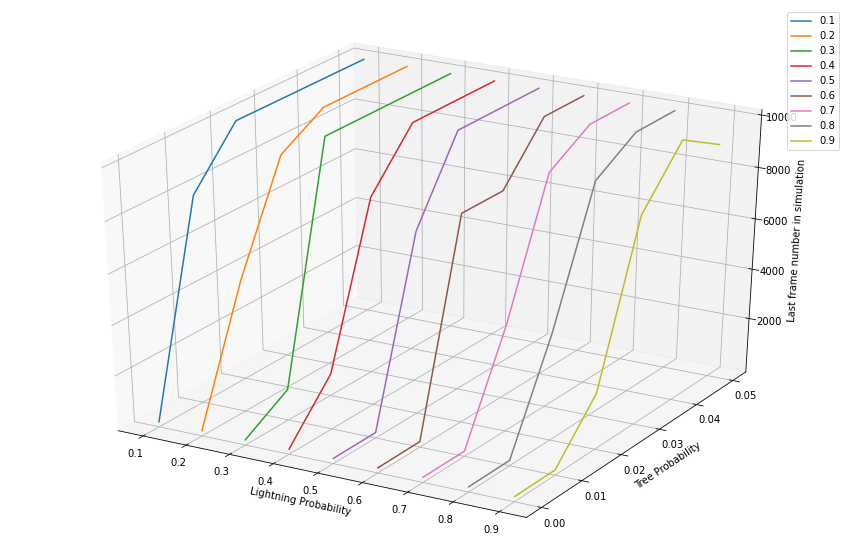

**Figure 11: A plot to show the effect of lightning and new tree growth probability on how far the simulation could run.** <br>
This graph shows how the lightning probability (x axis) together with probability of new tree growth (y axis) reflects how far the simulation can run for (z axis). Lightning values were tested in 0.1 increments from 0.1 to 0.9. Tree probability was tested from 0 to 0.05 in 0.01 increments. Each simulation was run 10 times. The maximum number of frames is 10 000.

This dataset showed some interesting trends. Firstly, that many of the simulations ran to completion (10000 frames). This even occurred at very low probabilities of new tree growth (4 %) paired with very high probability of lightning (90%). This suggests that new tree growth has a very strong effect on this simulation and a very low probability of new tree is all that is needed to allow for a simulation to run for a long time and achieve a so called "steady state". The simulations appeared to have run successfully, as seen through the controls. All the simulations with a 0.00 probability of tree growth burnt out very quickly (maximum average being 4.3 frames, except for where there was no lightning) which is to be expected. The graph shows the drastic effect of new tree growth probability. Even at high probabilities of lightning all the simulations manage to reach the top of the graph, or very near it. This graph also shows how as new tree growth probability increases, the more likely a simulation will reach 10 000 frames.

In addition, it is interesting to consider where this minimum point for reaching 10 000 frames lies for each of the simulations. Generally, as the lightning probability increases, the minimum value for the simulations to reach 10 000 frames also increases. At a 10 % probability of lightning this minimum value lies between 2 and 3 % probability of new tree growth. While at a 80% probability of lightning this minimum value lies between 4 and 5 %. This can also be seen through the shape of the graph. The top of the graph represents reaching 10 000 frames and a lower tree probability is needed for this to be achieved for lower values of lightning probability compared to higher lightning probabilities. This does support our hypothesis however these required changes in new tree growth are much smaller than we anticipated.

There are some anomalies in the data. Notably in 90% lightning probability at 4% new tree growth all the simulations reach 10 000 frames but not at 5% new tree growth. This is not what would be expected: in the other lightning values once a new tree growth probability leads to a simulation reaching 10 000 frames the higher new tree growth probabilities also reach 10 000 frames. This could be an anomaly in the dataset, utilising randomness can lead to some extreme values. In contrast, this could be a phenomena seen at higher probabilities of lightning. This could be a possible avenue of further research, however it is more likely to be a stochastic effect of our model.

In conclusion, these experiments demonstrate the large effect that new tree growth has on the simulation. Even at very low probabilities of new tree growth and very high lightning values, simulations were running for upwards of 1000 frames. The minimum value to achieve a "steady state" will likely sit with a low value for new tree probability compared to lightning and will depend on the probability for lightning. It would be interesting to repeat this experiment with higher resolution between 2 and 5 % new tree growth probabilities to come closer to finding this minimum "steady state" parameter. After considering these two parameters we thought it interesting to consider adding a new parameter in our model, we picked rainfall as thought this to be influential on forest fires in the real world.

<a id = "rain"> </a>

## 8. Rainfall
***
So far, we have only considered the effect of two sets of probabilities on the progression of forest fire. However, the nature of a forest fire is exponentially more complicated. To improve our model, we have added precipitation as a variable that in nature has a big impact on the severity of forest fires. We designed rainfall to occur in random patches on the grid that emulate rain clouds which move across the grid each frame in a random 'wind' direction initialised at the start of the simulation. Our rain cloud is just a 2d grid like our world grid. It will be much bigger than the forest grid but we will only show a small 'window' of it over the top of our grid. The rain window moves on each iteration in the direction of the wind, making it look like a rain cloud is moving across the forest.

To generate the effect of rain clouds onto our grid, we used Perlin Noise - an algorithm for generating random numbers in clusters that change gradually, creating 'smooth' transitions between high and low points. Where it is raining on the grid, there is an increased chance for tree growth and a decreased chance for lightning to occur (or, more intuitively, for fire to start).

In [9]:
#Import modules needed
from animation import animate_with_rain
from setup import initialise_with_rain

In [10]:
#Reset the variables to default
reset()

#This is the code to run the animation with rain 
#The probability of rain occurring is determined by the cloud threshold value in config
#Rain occurs randomly, so if rain does not appear, rerun this cell and it will likely occur 

#Initalise the grid by calling the initalise function
fig = initialise_with_rain()

#Call the animation to start!
#Fig - put the animation onto the figure object
#Animate - call the animate() function over and over until the end of the animation
#Frames- set the maximum amount of frames to be 100
#Interval - have an interval of 300 ms between frames
#Init_func - Call the init() function first
anim = FuncAnimation(fig, animate_with_rain, frames=100, interval=300, init_func = init)

#Runs this as HTML so can be viewed in a web browser!
HTML(anim.to_jshtml())

We hypothesised:

A) As the probability of rain increases, the average number of remaining trees in the final frame will increase.

B) As the probability of rain increases, the average number of frames in a simulation will increase.

In [ ]:
#Reset the variables
reset()

# We will input rain probability values into the simulation; as the value increases so does the chance of rain
rain_sim_values = np.array([0.0, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0])

#Runs the simulation function. 3 represents the rain simulation, sets the values to be tested and runs this 25 times.
rain_rem_trees, rain_last_frame = simulation(parameter = 3, sim_values = rain_sim_values, times = 25, frame_num = 100, rain = True)

#Plot the results
sim_plot(rain_sim_values, rain_rem_trees, rain_last_frame, "Rain Probability")

![alt text](./images/rain_graphs.png "Title")

**Fig 12. The effect of rain probability on number of remaining trees in last frame and number of frames in simulation:**
We tested the effect of rain probabilities from 0.0 - 1.0 by steps of 0.05, ran each value 25 times and calculated the mean, tree growth was at 3% and lightning was 3%, on a 10x10 grid for 100 frames.


We tested rain probability values between 0 to 1.0 in 0.05 steps. Each value was tested 25 times on a 10x10 grid with lightning and tree growth values set at 0.03. As expected, there is a clear trend showing that as rain probability increases, the number of remaining trees in the last frame increases. There are dips in the graph where the number of remaining trees in the last frame falls and then rises again, for example at rain probability 0.2 the mean number of remaining trees in the last frame drops from 0.28 to 0.22. This is to be expected because of the random nature of the simulation, which is accentuated when adding rain as another random variable.

At all rain probability values the number of frames in the simulation maxed out at 100, likely reaching a steady state, and so we could not determine the effect rain has on increasing the duration of the animation.

We then decided to rerun the same rain probability values again on a 10x10 grid, but with a lower tree growth (0.003) and a higher lightning probability (0.3) in order to generate a scenario where the animation is unlikely to reach a steady state. We did this to test the effect of rain on the number of frames in the simulation. We hypothesised that as rain probability increases, we should see the animations running on to a higher number of frames as tree growth is increased and fire decreased.

In [ ]:
#Reset the variables
reset()

# We will input rain probability values into the simulation; as the value increases so does the chance of rain
rain_sim_values = np.array([0.0, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0])

#Runs the simulation function. 3 represents the rain simulation, sets the values to be tested and runs this 25 times.
rain_rem_trees, rain_last_frame = simulation(parameter = 3, sim_values = rain_sim_values, times = 25, lightning = 0.3, tree_growth = 0.003, frame_num = 100, rain = True)

#Plot the results
sim_plot(rain_sim_values, rain_rem_trees, rain_last_frame, "Rain Probability")

![alt text](./images/rain_graphs_frames.png "Title")

**Fig 13. The effect of rain probability on number of remaining trees in last frame and number of frames in simulation:** We tested the effect of rain probabilities from 0.0 - 1.0 by steps of 0.05, ran each value 25 times and calculated the mean, tree growth was at 0.3% and lightning was 30%, on a 10x10 grid for 100 frames.

As shown before in figure 12, as rain probability increases, the number of remaining trees in the last frame increases. However, the trend is quite different when tree growth is 0.3% and lightning is 30%: curiously, there are no remaining trees in the last frame until rain probability is at 0.5, then the number of remaining trees in the last frame increases as rain probability increases. At 0.5 and above, the rain probability must be high enough to increase tree growth to a level where enough new trees are growing and this is maintained until the end of the animation. The line is less smooth than figure 12, with sharp peaks which is to be expected when lighting is set so high.

As expected, increasing the probability of rain increased the number of frames in each simulation (when tree growth is low and lightning is high) showing that rain does have an effect on the simulation which emulates real life in which rainfall protects against forest fires and facilitates new tree growth. There is a sharp peak at rain probability 0.5 which correlates with the remaining trees graph showing that rain starts to have an effect. Because 0.5 is the minimum value of rain probability to have an effect, this will be our chosen rain probability value for the following tests.

We then tested the effect rain has on a simulation with varying lightning probabilities (0 - 1) and a tree growth value of 0.3, to compare with figure 6 in section 5. We set rain at 0.5.

We hypothesised that the addition of rain in the simulation wouldn't affect the overall trend, but would increase the number of remaining trees in the last frame at each probability value.

In [ ]:
#Rest the variables
reset()

 

#Simulation of lightning values under rainfall
lightning_values_rain = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

 

#Runs the simulation function. 1 represents the lightning, sets the values to be tested and runs this 25 times.
lightning_rain_rem_trees, lightning_rain_last_frame = simulation(parameter = 1, sim_values = lightning_values_rain, times = 25, cloud_th = 0.5, rain = True)

 

#Plot the results
sim_plot(lightning_values_rain, lightning_rain_rem_trees, lightning_rain_last_frame, "Lightning Probability")

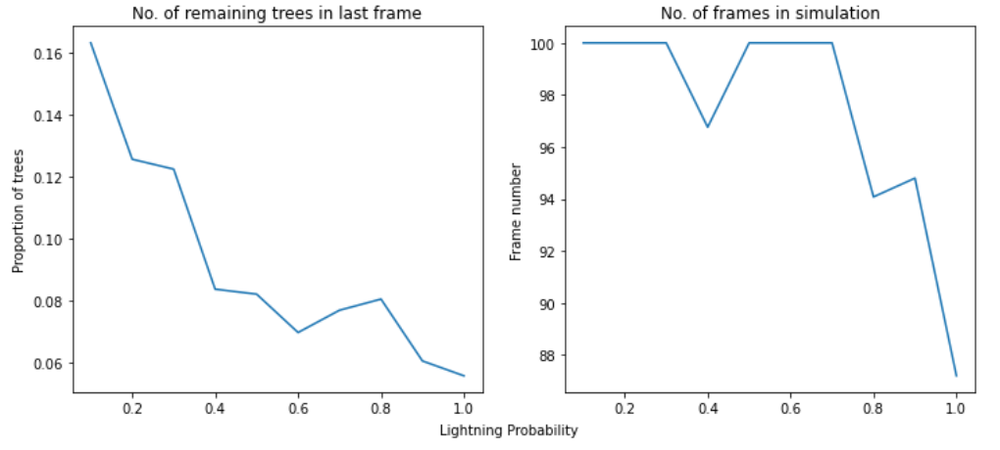

**Fig 14. The effect of lightning probability on the number of remaining trees in last frame and number of frames in simulation, under the effect of rainfall:** We tested the effect of lightning probabilities from 0.0 - 1.0 by steps of 0.1, ran each value 25 times and calculated the mean, tree growth was at 0.3% and rain probability was 50%, on a 10x10 grid for 100 frames.

As expected, the steady state number of trees is generally higher when there is rain compared to figure 6 when there is no rain. This demonstrates that rain has an impact on increasing tree growth and changing the balance of trees and fires in the simulation. The number of frames in the simulation follows a similar pattern to figure 6, and so rain hasn't had much effect on increasing the frame number in this simulation.


## Stability of steady state under rainfall

Rain is not a constant effect, but rather, adds another level of randomness to the simulation. Therefore, we wanted to investigate how rainfall effects the stability of the steady state.

To do this, we used a rain probability of 0.5, shown in the last test (figure 13) to be the minimum value at which rain has an effect on the simulation. We kept this as a constant and tested a range of tree_growth values - between 0.015 and 0.025 - which, as found from the combined simulations in Section 7, is likely a range in which the minimum "steady state" parameter lies. We chose a lightning probability of 0.35; in Figure 7 (section 5 ) there is a drop in the proportion of trees after the lightning probability of 0.35, and so we tried to select a value that could be the minimum value at which lightning has an effect on the simulation.

Each value was run 25 times and the mean was calculated. We ran this simulation on a 10x10 grid for 1000 frames to try and allow simulations to reach a steady state whilst minimising time and computing power. Attempts to run to 10,000 frames weren't possible within our time frame because rain added too much complexity to the simulation.

We hypothesised that:

A) The addition of rain will lower the tree growth probability needed to reach a steady state because rain would most likely change the steady state in favour of tree growth

B) The addition of rain will disrupt the stability of the steady state, because rain is random and doesn't always occur. When we run the animation multiple times, we have observed that there are often long intervals where there is no rain at all. As 1000 frames is a long time, we expect there to be long periods with no rain that would disrupt the steady state. This emulates the biological phenomenon of drought which has a large effect on forest growth and stability.

In [ ]:
#Rest the variables
reset()

#Simulation of tree growth values under rainfall
tree_growth_values = np.arange(start = 0.015, stop = 0.025, step = 0.001)

#Runs the simulation function. 0 represents the tree growth, sets the values to be tested and runs this 25 times.
ss_rain_rem_trees, ss_rain_last_frame = simulation(parameter = 0, sim_values = tree_growth_values, times = 25, cloud_th = 0.5, lightning = 0.35, rain = True, frame_num = 1000)

#Plot the results
sim_plot(tree_growth_values, ss_rain_rem_trees, ss_rain_last_frame, "Tree Growth Probability")

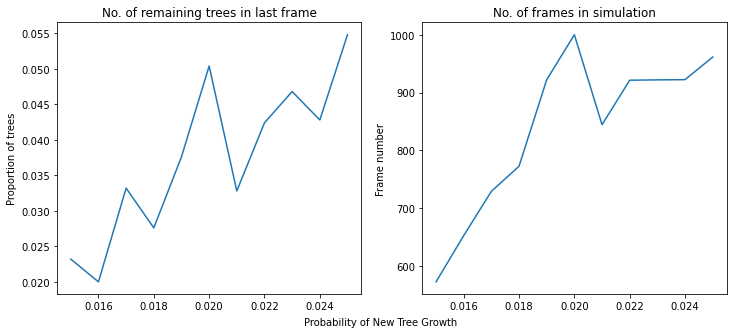

**Fig 15. The effect of new tree growth with rain on number of remaining trees in last frame and number of frames in simulation:** We tested the effect of tree growth probabilities from 0.015 - 0.025 by steps of 0.001, ran each value 25 times and calculated the mean, rain probability was set to 50% and lightning to 35%, on a 10x10 grid for 1000 frames.

We can see that as the probability of new tree growth increases, as does the proportion of trees remaining in the last frame which is as expected. The number of frames in the simulation also increases with rising tree growth probability and manages to get to 1000 frames at 0.02 which could imply it reaches a steady state. The drop after reaching 1000 frames at tree growth probability of 0.021 could imply that rain has caused a disruption to the stability of the steady state - under a stable steady state it would be expected that the graph continues to reach 1000 frames after 0.02. However, the graph does not provide enough information to enable us to make these conclusions. Future experiments would ideally:

- run to more frames:
    - Why would it help: provide an increased confidence that the steady state was reached
    - Why we didn't do it this time: computational complexity was too great within the time constraints
- run more sets of max iterations (times):
    - Why would it help: allow the emergence of potentially missed correlations or provide confidence in the identification of existing correlations
    - Why we didn't do it this time: computational complexity was too great within the time constraints
- use a control simulation where the entire grid is raining constantly
    - Why would it help: demonstrates the effect of rain is working as described and proves the absence of the rain affect in graphs is a result of randomness and not a product of a code bug
    - Why we didn't do it this time: deemed unnecessary use of time when compared with the other options, the calculations for applying rain themselves are quite simple and can be inferred from reading the workbook. The complexity arises from the random element of its application.

<a id = "limit"> </a>

## 9. Limitations

In this sections we address some of the assumptions and limitations of our models.

A. <u> Rate of tree growth </u>

The time it takes for a tree to grow (1 frame) is equal to the time it takes to burn down (1 frame). While this makes for entertaining graphics, in reality an adult tree can take up to 30 years to grow, but only a few hours to burn down. The disproportionately rapid tree growth exerts a much stronger effect than would be in reality. This could explain why so many of simulations were running until the end, even with very high probabilities of lightning. This heavily skews the outcome favourably towards forest survival when in fact, a similar rate of spontaneous fire would wipe out the forest entirely. 

B. <u> Grid representation of Forest </u>

In our model we represent the forest as discrete data stored in grids and one cell can only represent one tree. In nature the state of a forest fire may not be sufficiently described by only three values. Forest vegetations also come in many different sizes and varieties, all of which affect the behaviour of wildfire. A large, dense tree will take longer than dried grass to burn through. Having a uniform time duration for all events fails to capture this heterogeneity. 

C. <u> A range of other factors </u>

As well as decreasing the chance of fire starting and increasing the growth of new trees, rainfall impacts many other aspects of a forest and thus forest fire spreading. For example, the intensity, frequency and duration of rainfall will determine how wet the ground and canopy is which changes the probability of fire starting and spreading. We have therefore not sufficiently modelled all aspects of rain. Moreover, there are many other weather attributes that have important implications on the occurrence and severity of forest fires and could be included in the simulation. For example, whilst wind was implemented for rain cloud movement, it could also be made to impact the direction of the spread of fire. In addition, when considering lightning: in some forests, such as rainforests, increasing the probability of rainfall would most likely increase the probability of lightning. In this simulation lightning could be substituted for another "random" event that could start a fire such as smoking or campfires. For this study we have studied the factors as if they were independent of one another, but this is not always the case in nature.

D. <u> What is a steady state? </u>

A steady state situation occurs when variables are constant despite ongoing processes. In the context of this model we decided that this would be where the simulation kept running despite trees still setting on fire and regrowing. That is, the simulation is still running but not achieving "burn out". In this simulation we took this to be 10 000 frames. However, we are aware that if we were to increase the number of frames we would likely find specific values that allowed the simulation to run on. That is, the values that we found made it to 10 000 frames may not make it to 1 or 10 million frames. This is a very large limitation of our study and with more time this could be interesting to study. In particular, how low this new tree probability would have to be to fufil these higher frame counts. In addition, a "steady state" could be thought of as a set of values that, possibly after the large initial drop due to the neighbourhood effect, the proportion of trees in a forest is stable due to a balance between lightning and new tree growth. This would be harder to achieve and test than our definition of a steady state. As lightning has a large effect on its neighbours, the new tree growth would need to keep up with this.  

E. <u> How random is random? </u>

This simulation utilises the python random module to generate random numbers. However, it should be noted that the random module only generates pseudo random numbers. That is, as these numbers are generated by a computer they are not truly random as computers are predictable by design. This could be seen as a limitation, as parts of our simulation rely on "randomness" and so to achieve that we may need true "random-ness". However, this can also be seen as an advantage as this actually allows for reproducibility (which cannot be achieved with true random methods of generating random numbers) which is crucial in scientific studies such as this. In addition, the random module is popular with many scientists and we do not believe that the numbers only achieving pseudo-randomness will have an effect on the simulation.

F. <u> Severity of fire </u>

Furthermore, a fire may not destroy a tree and all its related root system completely. Therefore, it would take less time to regrow if a fire is less severe, while a more severe fire will generate more heat that makes it more likely to spread to the surrounding vegetations. In our model, we did not incorporate the intensity of the fire. Instead, we employed binary state (i.e. trees are either on fire or not), that may be an oversimplification of natural events.

<a id = "future"> </a>

## 10. Future Directions

When considering the edge of the grid we decided the fire should ignore the edges. However, there is plenty to consider here. We could have tested adapting the code so when the fire ends at one end of the grid it wraps around and starts a fire at another edge. This was not completed for this simulation as we decided on a 10x10 grid this would to the grid burning out too fast. With a larger grid this could provide interesting insights into the effects. This would likely increase the probability that a simulation would "burn out" and so the frame the simulation ends on would likely decrease. In addition, we also assume there is nothing around the outside of the grid that could cause a fire. This could be adapted by adding a probability that a fire is set outside of the grid. However, it could be argued that this could add more complexity and alternative would be to simply increase the grid size. Although it would be interesting to trial these two methods.

During discussion of this model, we were interested by the notion that this model could be vastly different dependent on where in the world it is set. For example: a rainforest is likely to be much wetter and so less fire spread but perhaps an increased chance of lightning. Differing areas of the world will have different probabilities of lightning and rates of tree growth. In future studies it could be interesting to use simulations to alter the pre-existing  parameters (lightning, new tree growth and rain) or add new ones (wind, humidity) to represent different areas of the world. Comparing these simulations could give information about the effect of different parameters on different types of forest fires and, ultimately, how these fires in different parts of the world differ from each other.

However, there is also the basic set up of the model to consider. Many forests are not one solid block of trees and will have other landmarks. We discussed the influence of rivers. These would block the transmission of fire as the fire would not be able to cross rivers. However this would require adaptation of our current model: either making the grid larger to accommodate a river running through or changing what a cell represents. In our model we always considered one cell to be one tree. However, this need not always be the case. One cell could instead represent a square mile or an acre of forest. We would predict that adding rivers to our model would decrease the probability of a grid "burning out" and allow a simulation to last longer. We could also add villages or settlements to our model. Fires near these areas could be put out by the people in the village, or fires could be more likely to occur around these areas due to smoking or humans setting intential fires that may get out of control. This could add a new, interesting dynamic to our model. 

Lastly, as we talked about in section 9, it would also be more realistic to model the time it takes tree to grow to be proportional to that in reality. This goes hand-in-hand with the idea of trees burning out completely. Larger trees, in theory, have more extensive root system and more stored water. They take longer to burn and are less likely to be completely destroyed in a fire. If such is the case, then the regrowth should take less time. However, longer time to burn also means higher chance to spread to neighbours. This certainly also plays a part in the dynamics of forest fire. Moreover, a recently burnt forest could return a large amount of nutrients to the soil and be favourable to tree growth. We have conceptualized a few possible ways to implement this, one of which is through having probability values for survival rate in a fire, i.e. there is a chance that a fire does not turn the tree into empty cell directly. Another way is to randomise the percentage of trees destroyed and have tree growth rate proportional to this percentage. The grid would then have a heterogeneous growth rate, instead of a uniform one. 

A more detailed analysis could be achieved with the use of `class` for each individual trees. This way, we can encode a lot more information into each individual tree such as humidity, age and states. The probability of spontaneous fire and growth can then be calculated with a formula that is a function to all those factors. This way, we can have more variations of the parameters even within a single forest. 

<a id = "final"> </a>

## 11. Final thoughts and conclusions
Running these simulations allowed us to understand the dynamics of our model more deeply. The large drop in number of trees in the beginning (the "neighbour effect") demonstrates just how important early intervention is in forest fires. Studying the effects of the lightning and tree growth demonstrated that the new tree growth parameter has a very large effect on the outcome of the model- even at very low probabilities. Adding the new rain parameter demonstrated how adjusting and changing the rules of Cellular Automata can adjust and influence the model. Although our model is limited in how "true to life" it is, models such as this allow for learning more about the dynamics of real forest fires. Adding new parameters such as landmarks and populations could give more information on the differing rate of fire spread across areas of forest or even countries. This could led to information on where measures to prevent forest fires are most effect: this gives a dynamic and preventative measure to tackling forest fires.